![](https://tse4.mm.bing.net/th?id=OIP.zN1wmN4DIre-HT2j1tT0dwHaCu&pid=15.1&P=0&w=451&h=167)

# Let's have a quick look at the 'iWildCam 2019 - FGVC6' data...

Camera Traps (or Wild Cams) enable the automatic collection of large quantities of image data. Biologists all over the world use camera traps to monitor biodiversity and population density of animal species. We have recently been making strides towards automating the species classification challenge in camera traps, but as we try to expand the scope of these models from specific regions where we have collected training data to nearby areas we are faced with an interesting probem: how do you classify a species in a new region that you may not have seen in previous training data?



In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
from PIL import Image
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory
import warnings
warnings.filterwarnings("ignore")
import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['sample_submission.csv', 'test_images', 'train_images', 'test.csv', 'train.csv']


# Let's read data...

In [2]:
train = pd.read_csv('../input/train.csv')
test = pd.read_csv('../input/test.csv')
train.head(5)

,category_id,date_captured,file_name,frame_num,id,location,rights_holder,seq_id,seq_num_frames,width,height
0,19,2011-05-13 23:43:18,5998cfa4-23d2-11e8-a6a3-ec086b02610b.jpg,1,5998cfa4-23d2-11e8-a6a3-ec086b02610b,33,Justin Brown,6f084ccc-5567-11e8-bc84-dca9047ef277,3,1024,747
1,19,2012-03-17 03:48:44,588a679f-23d2-11e8-a6a3-ec086b02610b.jpg,2,588a679f-23d2-11e8-a6a3-ec086b02610b,115,Justin Brown,6f12067d-5567-11e8-b3c0-dca9047ef277,3,1024,747
2,0,2014-05-11 11:56:46,59279ce3-23d2-11e8-a6a3-ec086b02610b.jpg,1,59279ce3-23d2-11e8-a6a3-ec086b02610b,96,Erin Boydston,6faa92d1-5567-11e8-b1ae-dca9047ef277,1,1024,747
3,0,2013-10-06 02:00:00,5a2af4ab-23d2-11e8-a6a3-ec086b02610b.jpg,1,5a2af4ab-23d2-11e8-a6a3-ec086b02610b,57,Erin Boydston,6f7d4702-5567-11e8-9e03-dca9047ef277,1,1024,747
4,0,2011-07-12 13:11:16,599fbd89-23d2-11e8-a6a3-ec086b02610b.jpg,3,599fbd89-23d2-11e8-a6a3-ec086b02610b,46,Justin Brown,6f1728a1-5567-11e8-9be7-dca9047ef277,3,1024,747


# Dataset size:

In [3]:
print('size of train data',train.shape)
print('size of test data',test.shape)

size of train data (196299, 11)
size of test data (153730, 10)


# Target Distribution in the Train dataset:

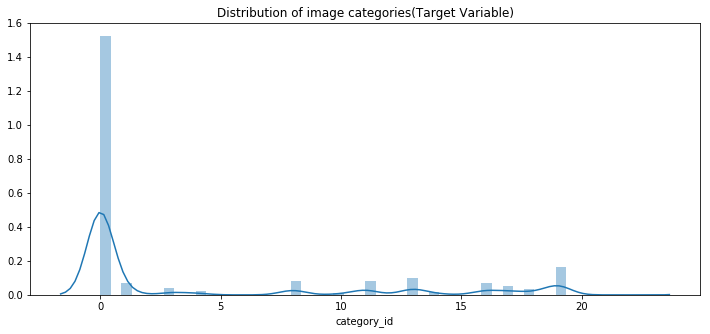

In [4]:
plt.figure(figsize=(12,5))
plt.title("Distribution of image categories(Target Variable)")
ax = sns.distplot(train["category_id"])

# Location Distribution in the Train dataset:

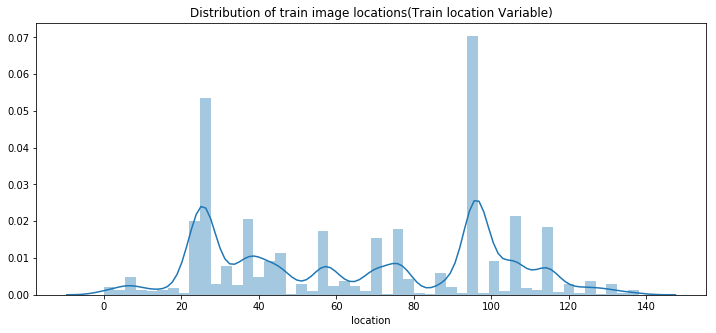

In [5]:
plt.figure(figsize=(12,5))
plt.title("Distribution of train image locations(Train location Variable)")
ax = sns.distplot(train["location"])

# Location Distribution in the Test dataset:

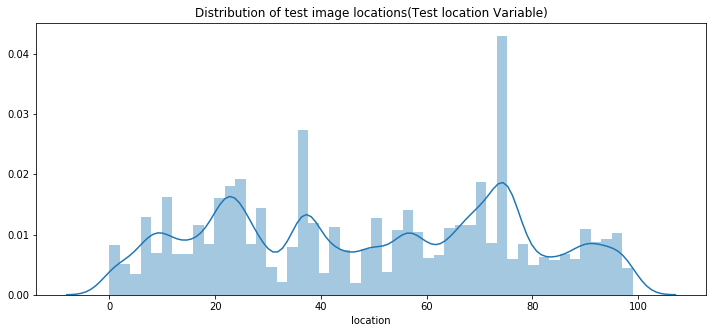

In [6]:
plt.figure(figsize=(12,5))
plt.title("Distribution of test image locations(Test location Variable)")
ax = sns.distplot(test["location"])

# Can we do something with Image size?

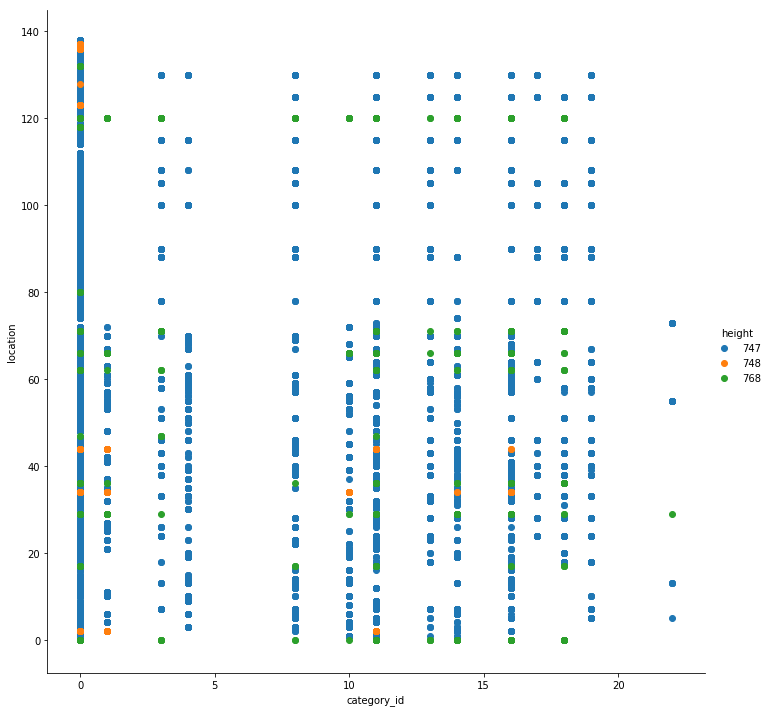

In [7]:
sns.FacetGrid(train, hue="height", size=10).map(plt.scatter, "category_id", "location").add_legend()

# Let's have a look at timestamps...

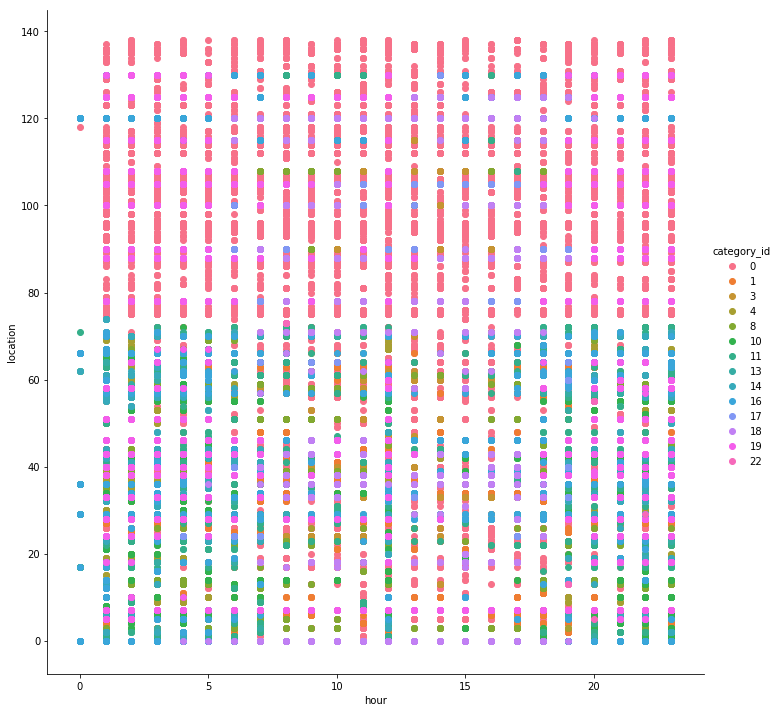

In [8]:
train['date'] = train['date_captured'].str.split('\s+').str[0]
train['time'] = train['date_captured'].str.split('\s+').str[-1]    
train['hour'] = pd.to_numeric(train['time'].str[:2], errors='coerce')
sns.FacetGrid(train, hue="category_id", size=10).map(plt.scatter, "hour", "location").add_legend()

# Day / Night samples ratio:

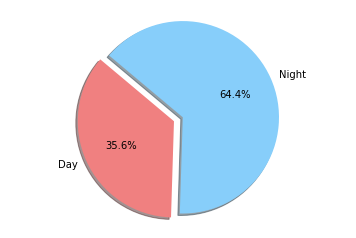

In [9]:
night = train[(train['hour'] > 19) | (train['hour'] < 7)]
day = len(train) - len(night)
labels = 'Day', 'Night'
sizes = [len(night), day]
colors = ['lightcoral', 'lightskyblue']
explode = (0.1, 0) 
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
plt.show()

# Time to display some image samples collected during the night: 

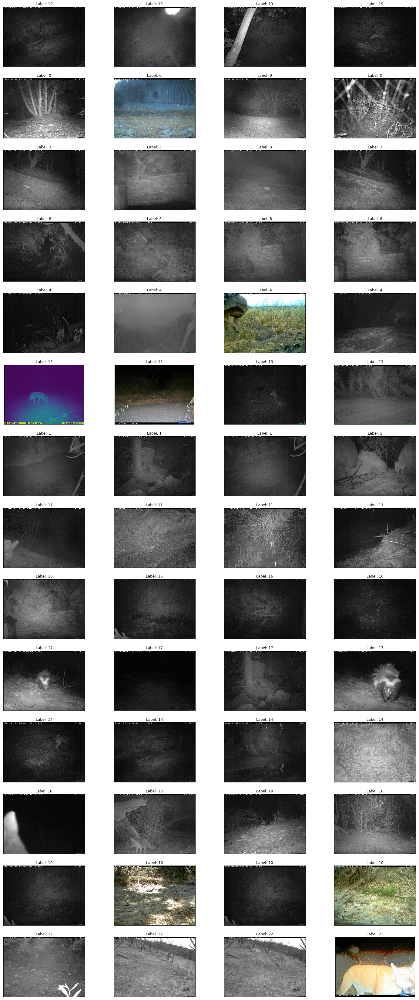

In [10]:
# sample night images
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(night.loc[night['category_id'] == i, 'file_name'], 4) for i in night.category_id.unique()]
imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in train.category_id.unique()]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):
    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../input/train_images/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

# Time to display some image samples collected during the day: 

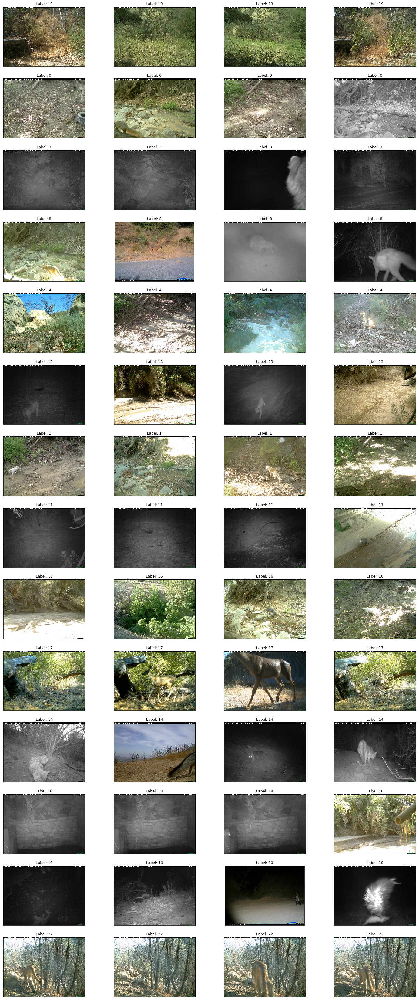

In [11]:
day = train[(train['hour'] < 19) & (train['hour'] > 7)]
# sample night images
fig = plt.figure(figsize=(25, 60))
imgs = [np.random.choice(day.loc[day['category_id'] == i, 'file_name'], 4) for i in day.category_id.unique()]
imgs = [i for j in imgs for i in j]
labels = [[i] * 4 for i in train.category_id.unique()]
labels = [i for j in labels for i in j]
for idx, img in enumerate(imgs):
    ax = fig.add_subplot(14, 4, idx + 1, xticks=[], yticks=[])
    im = Image.open("../input/train_images/" + img)
    plt.imshow(im)
    ax.set_title(f'Label: {labels[idx]}')

# To be continued...